In [1]:
#!pip install statsmodels
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
import matplotlib.dates as mdates

# Importing the datasets

In [2]:
pd.set_option("display.float_format", "{:.2f}".format)  

## Population dataset

In [3]:
population_dataset = pd.read_csv('data/Population/POP.csv')
population_dataset = population_dataset.drop(['realtime_start', 'realtime_end'], axis=1)
population_dataset['date'] = pd.to_datetime(population_dataset['date'])
population_dataset = population_dataset.sort_values(by='date')
# growth rate
population_dataset['growth'] = (population_dataset['value']- population_dataset['value'].shift(periods=1))/ population_dataset['value'].shift(periods=1) *100

In [4]:
population_dataset.head()

,value,date,growth
0,156309.00,1952-01-01,NaN
1,156527.00,1952-02-01,0.14
2,156731.00,1952-03-01,0.13
3,156943.00,1952-04-01,0.14
4,157140.00,1952-05-01,0.13


Monthly US population data

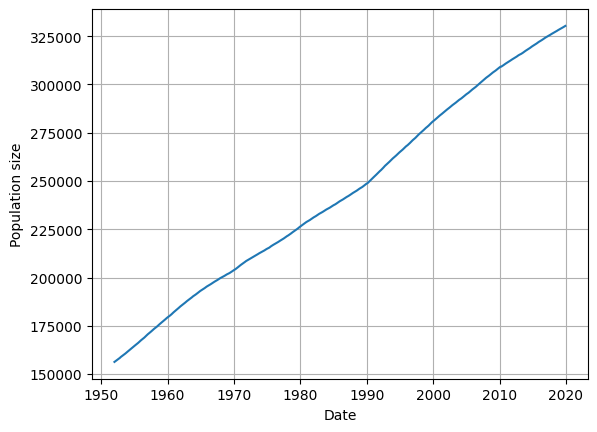

In [5]:
plt.plot(population_dataset['date'], population_dataset['value'])
plt.xlabel('Date')
plt.ylabel('Population size')
plt.grid(True)
plt.show()

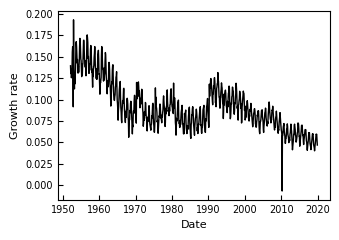

In [6]:
plt.figure(figsize=(3.5, 2.5))

plt.plot(
    population_dataset['date'],
    population_dataset['growth'],
    color='black',
    linestyle='-',
    linewidth=1
)

plt.xlabel('Date', fontsize=8)
plt.ylabel('Growth rate', fontsize=8)

plt.tick_params(axis='both', which='major', labelsize=7, direction='in')
plt.grid(False)  

plt.tight_layout()
plt.show()

In [7]:
# Find the 5 mean summary, missing values and othe rthings.
population_dataset.shape
print("Date Statistics:")
print("Min Date:", population_dataset['date'].min())
print("Max Date:", population_dataset['date'].max())
print("\nGrowth Rate Statistics:")
display(population_dataset['growth'].describe())

Date Statistics:
Min Date: 1952-01-01 00:00:00
Max Date: 2019-12-01 00:00:00

Growth Rate Statistics:


count   815.00
mean      0.09
std       0.03
min      -0.01
25%       0.07
50%       0.09
75%       0.11
max       0.19
Name: growth, dtype: float64

In [8]:
# Test if stationary or not
population_dataset= population_dataset.dropna()
adfuller(population_dataset['growth'])

# p-value is 0.3258 therefore can't reject H0 at 5% significant level
# The time-series is non-stationary

(-1.91323845394926,
 0.32585918158877186,
 21,
 793,
 {'1%': -3.438623132449471,
  '5%': -2.8651915799370014,
  '10%': -2.568714441670417},
 -5799.485289397973)

In [9]:
# Test if stationary or not
population_dataset= population_dataset.dropna()
adfuller(population_dataset['value'])

# p-value is 0.8709 therefore can't reject H0 at 5% significant level
# The time-series is non-stationary

(-0.600122441099354,
 0.8709543578019703,
 17,
 797,
 {'1%': -3.438581476199162,
  '5%': -2.865173218890781,
  '10%': -2.56870466056054},
 6584.216070290454)

## Stocks

In [10]:
stock_dataset = pd.read_csv('data/SP500/sp500_companies.csv')
stock_full_dataset = pd.read_csv('data/SP500/sp500_stocks.csv')

# Only looking at microsoft

In [11]:
stock_dataset.head()

,Exchange,Symbol,Shortname,Longname,Sector,Industry,Currentprice,Marketcap,Ebitda,Revenuegrowth,City,State,Country,Fulltimeemployees,Longbusinesssummary,Weight
0,NMS,AAPL,Apple Inc.,Apple Inc.,Technology,Consumer Electronics,254.49,3846819807232,134660997120.00,0.06,Cupertino,CA,United States,164000.00,"Apple Inc. designs, manufactures, and markets ...",0.07
1,NMS,NVDA,NVIDIA Corporation,NVIDIA Corporation,Technology,Semiconductors,134.70,3298803056640,61184000000.00,1.22,Santa Clara,CA,United States,29600.00,NVIDIA Corporation provides graphics and compu...,0.06
2,NMS,MSFT,Microsoft Corporation,Microsoft Corporation,Technology,Software - Infrastructure,436.60,3246068596736,136551997440.00,0.16,Redmond,WA,United States,228000.00,Microsoft Corporation develops and supports so...,0.06
3,NMS,AMZN,"Amazon.com, Inc.","Amazon.com, Inc.",Consumer Cyclical,Internet Retail,224.92,2365033807872,111583002624.00,0.11,Seattle,WA,United States,1551000.00,"Amazon.com, Inc. engages in the retail sale of...",0.04
4,NMS,GOOGL,Alphabet Inc.,Alphabet Inc.,Communication Services,Internet Content & Information,191.41,2351625142272,123469996032.00,0.15,Mountain View,CA,United States,181269.00,Alphabet Inc. offers various products and plat...,0.04


In [12]:
stock_full_dataset['Date'] = pd.to_datetime(stock_full_dataset['Date'])
stock_full_dataset = stock_full_dataset.sort_values(by='Date')

stock_full_dataset = stock_full_dataset[stock_full_dataset['Symbol'] == "MSFT"]
stock_full_dataset = stock_full_dataset[stock_full_dataset['Date'] > '2020-01-01']
stock_full_dataset.head()

,Date,Symbol,Adj Close,Close,High,Low,Open,Volume
1196972,2020-01-02,MSFT,153.63,160.62,160.73,158.33,158.78,22622100.00
1196973,2020-01-03,MSFT,151.72,158.62,159.95,158.06,158.32,21116200.00
1196974,2020-01-06,MSFT,152.11,159.03,159.10,156.51,157.08,20813700.00
1196975,2020-01-07,MSFT,150.72,157.58,159.67,157.32,159.32,21634100.00
1196976,2020-01-08,MSFT,153.12,160.09,160.80,157.95,158.93,27746500.00


In [13]:
# returns
stock_full_dataset['returns'] = (stock_full_dataset['Close']- stock_full_dataset['Close'].shift(periods=1))/ stock_full_dataset['Close'].shift(periods=1) *100

In [14]:
print("Min Date:", stock_full_dataset['Date'].min())
print("Max Date:", stock_full_dataset['Date'].max())
print("\nReturns Statistics:")
display(stock_full_dataset['returns'].describe())

Min Date: 2020-01-02 00:00:00
Max Date: 2024-12-20 00:00:00

Returns Statistics:


count   1251.00
mean       0.10
std        1.92
min      -14.74
25%       -0.85
50%        0.11
75%        1.10
max       14.22
Name: returns, dtype: float64

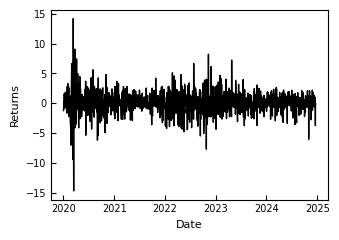

In [15]:
plt.figure(figsize=(3.5, 2.5))

plt.plot(
    stock_full_dataset['Date'],
    stock_full_dataset['returns'],
    color='black',
    linestyle='-',
    linewidth=1
)

plt.xlabel('Date', fontsize=8)
plt.ylabel('Returns', fontsize=8)

plt.tick_params(axis='both', which='major', labelsize=7, direction='in')
plt.grid(False)  

plt.tight_layout()
plt.show()

In [16]:
# Test if stationary or not
stock_full_dataset= stock_full_dataset.dropna()
adfuller(stock_full_dataset['returns'])

# p-value is 0.0 therefore can reject H0 at 5% significant level
# The time-series is stationary

(-11.325636154183794,
 1.1453651353238746e-20,
 8,
 1242,
 {'1%': -3.4356260602190356,
  '5%': -2.863869899335344,
  '10%': -2.5680104683371323},
 5024.279229715285)

## Weather

In [17]:
weather_dataset = pd.read_csv("data/Weather/South_Africa_weather_data.csv")
weather_dataset['Date'] = pd.to_datetime(weather_dataset['Date'], format='%d-%m-%Y')
weather_dataset = weather_dataset[weather_dataset['Date'] > '2018-01-01']

def classify_weather(row):
    if row['Precipitation_Sum'] > 3:
        return "Rainy"
    elif row['Windspeed_Max'] > 35:
        return "Windy"
    elif row['Sunshine_Duration'] > 9*60*60:
        return "Sunny"
    else:
        return "Cloudy"

weather_dataset['Weather'] = weather_dataset.apply(classify_weather, axis=1)

# Make it categorical
weather_dataset['Weather'] = weather_dataset['Weather'].astype('category')

In [18]:
weather_dataset.head()


,Country,Date,Temp_Max,Temp_Min,Temp_Mean,Precipitation_Sum,Windspeed_Max,Windgusts_Max,Sunshine_Duration,Weather
6576,South_Africa,2018-01-02,30.00,11.70,21.60,0.00,27.60,41.80,46837.43,Sunny
6577,South_Africa,2018-01-03,33.20,16.40,26.30,0.00,23.40,40.00,46800.00,Sunny
6578,South_Africa,2018-01-04,36.90,20.10,29.60,0.00,30.40,46.10,46800.00,Sunny
6579,South_Africa,2018-01-05,37.80,20.10,30.50,0.00,32.00,51.80,46800.00,Sunny
6580,South_Africa,2018-01-06,37.30,18.70,29.00,0.00,33.20,53.60,46836.28,Sunny


In [19]:
weather_dataset['Weather'].describe()

count      2190
unique        4
top       Sunny
freq       1628
Name: Weather, dtype: object

In [20]:
weather_dataset_encoded = pd.get_dummies(weather_dataset, columns=['Weather'], prefix='Weather', dtype=int)
display(weather_dataset_encoded.head())

,Country,Date,Temp_Max,Temp_Min,Temp_Mean,Precipitation_Sum,Windspeed_Max,Windgusts_Max,Sunshine_Duration,Weather_Cloudy,Weather_Rainy,Weather_Sunny,Weather_Windy
6576,South_Africa,2018-01-02,30.00,11.70,21.60,0.00,27.60,41.80,46837.43,0,0,1,0
6577,South_Africa,2018-01-03,33.20,16.40,26.30,0.00,23.40,40.00,46800.00,0,0,1,0
6578,South_Africa,2018-01-04,36.90,20.10,29.60,0.00,30.40,46.10,46800.00,0,0,1,0
6579,South_Africa,2018-01-05,37.80,20.10,30.50,0.00,32.00,51.80,46800.00,0,0,1,0
6580,South_Africa,2018-01-06,37.30,18.70,29.00,0.00,33.20,53.60,46836.28,0,0,1,0


In [21]:
weather_dataset_encoded.describe()

,Date,Temp_Max,Temp_Min,Temp_Mean,Precipitation_Sum,Windspeed_Max,Windgusts_Max,Sunshine_Duration,Weather_Cloudy,Weather_Rainy,Weather_Sunny,Weather_Windy
count,2190,2190.00,2190.00,2190.00,2190.00,2190.00,2190.00,2190.00,2190.00,2190.00,2190.00,2190.00
mean,2020-12-31 12:00:00,25.74,10.88,18.46,0.58,27.12,44.78,38400.66,0.05,0.05,0.74,0.15
min,2018-01-02 00:00:00,7.90,-3.70,3.30,0.00,8.90,15.80,0.00,0.00,0.00,0.00,0.00
25%,2019-07-03 06:00:00,20.60,5.50,12.80,0.00,21.00,35.30,34163.99,0.00,0.00,0.00,0.00
50%,2020-12-31 12:00:00,26.10,11.20,18.90,0.00,26.70,44.30,39091.18,0.00,0.00,1.00,0.00
75%,2022-07-01 18:00:00,31.58,16.10,24.08,0.00,32.30,52.90,43946.76,0.00,0.00,1.00,0.00
max,2023-12-31 00:00:00,40.40,27.50,33.40,44.50,58.30,88.20,47180.80,1.00,1.00,1.00,1.00
std,NaN,6.89,6.34,6.66,2.60,8.22,12.80,6982.20,0.22,0.22,0.44,0.36


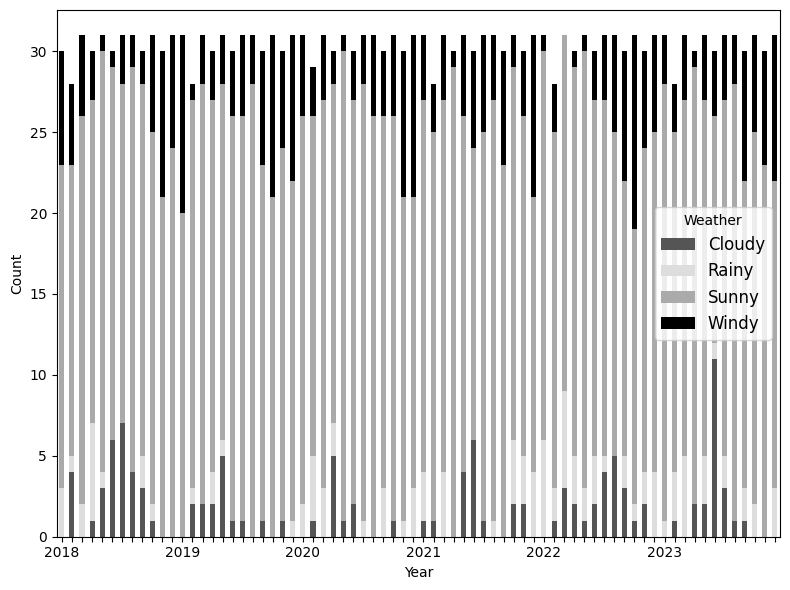

In [22]:

counts = weather_dataset.groupby(
    [pd.Grouper(key='Date', freq='ME'), 'Weather'], observed=True
).size().unstack(fill_value=0)
colors = ['#555555', '#DDDDDD', '#AAAAAA','#000000']  # black to light gray
ax=counts.plot(kind='bar', stacked=True, figsize=(8,6), color=colors)

years = counts.index.year
labels = [str(years[i]) if (i == 0 or years[i] != years[i-1]) else '' for i in range(len(years))]

ax.set_xticklabels(labels, rotation=0)

plt.xlabel("Year", fontsize=10)
plt.ylabel("Count", fontsize=10)
plt.legend(title='Weather', fontsize=12, loc='right')
plt.tight_layout()
plt.show()

In [23]:
# Do non-stationarity test - how to do it for categorical

# There is seasonality - maybe test with other numberical values...

## Property Sales

In [24]:
property_dataset = pd.read_csv("data/Property_Sale/ma_lga_12345.csv")
property_dataset=property_dataset[property_dataset.type=='house']
property_dataset['saledate'] = pd.to_datetime(property_dataset['saledate'], format='%d/%m/%Y')
property_dataset = property_dataset.sort_values(by='saledate')

In [25]:
property_dataset.head()

,saledate,MA,type,bedrooms
100,2007-03-31,548969,house,4
49,2007-03-31,421291,house,3
50,2007-06-30,421291,house,3
101,2007-06-30,548969,house,4
51,2007-09-30,421291,house,3


In [26]:
print("Min Date:", property_dataset['saledate'].min())
print("Max Date:", property_dataset['saledate'].max())
print("\nPrice Statistics:")
display(property_dataset['MA'].describe())

Min Date: 2007-03-31 00:00:00
Max Date: 2019-09-30 00:00:00

Price Statistics:


count       200.00
mean     627797.81
std      166728.11
min      416031.00
25%      485621.00
50%      584932.00
75%      771232.00
max     1017752.00
Name: MA, dtype: float64

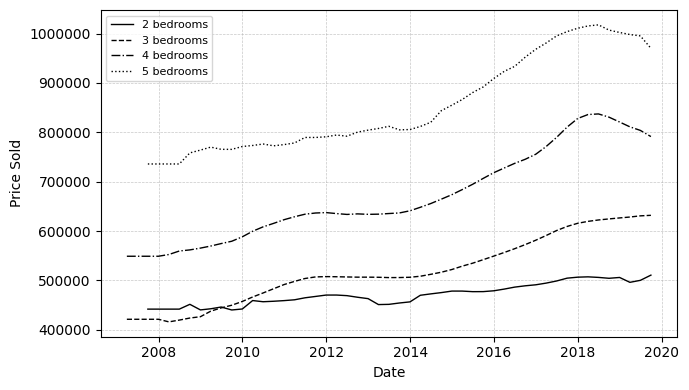

In [27]:
plt.figure(figsize=(7, 4))  # single-column IEEE style

# Different line styles for distinction
line_styles = ['-', '--', '-.', ':']  

for i, b in enumerate(sorted(property_dataset['bedrooms'].unique())):
    subset = property_dataset[property_dataset['bedrooms'] == b]
    plt.plot(
        subset['saledate'], subset['MA'],
        line_styles[i % len(line_styles)],  # cycle styles
        label=f'{b} bedrooms',
        color='black',
        linewidth=1
    )

plt.xlabel('Date', fontsize=10)
plt.ylabel('Price Sold', fontsize=10)
plt.legend(fontsize=8, loc='best')
plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)
plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()


In [28]:
# Test if stationary or not
for b in property_dataset['bedrooms'].unique():
    subset = property_dataset[property_dataset['bedrooms'] == b]
    results = adfuller(subset['MA'], maxlag = 6, autolag=None)
    print("ADF for ",b, " rooms")
    print(results)

# p-value is 0.91, 0.99, 0.43, 0.03. Only 5 is stationary

ADF for  4  rooms
(-2.0863299386921588, 0.2500468100779769, 6, 44, {'1%': -3.5885733964124715, '5%': -2.929885661157025, '10%': -2.6031845661157025})
ADF for  3  rooms
(-0.29432223683634834, 0.9263046328631273, 6, 44, {'1%': -3.5885733964124715, '5%': -2.929885661157025, '10%': -2.6031845661157025})
ADF for  5  rooms
(-2.6235780420806885, 0.08822141882172396, 6, 42, {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895})
ADF for  2  rooms
(-0.01054050389217547, 0.9576516646596029, 6, 42, {'1%': -3.596635636000432, '5%': -2.933297331821618, '10%': -2.6049909750566895})


## Amazon fires

In [29]:
fires_dataset = pd.read_csv("data/Fire/amazon.csv")
fires_dataset['date'] = pd.to_datetime(
    fires_dataset['year'].astype(str) + '-' + fires_dataset['month'].astype(str) + '-01'
)
fires_dataset = fires_dataset.drop(['year', 'month'], axis = 1)
fires_dataset['date'] = pd.to_datetime(fires_dataset['date'])
fires_dataset = fires_dataset.sort_values(by='date', ascending=False)

In [30]:
#Number of state fires
state_fires = fires_dataset.groupby('state')['number'].sum().sort_values(ascending=False).reset_index()
state_fires

,state,number
0,Mato Grosso,96246.03
1,Paraiba,52435.92
2,Sao Paulo,51121.20
3,Rio,45160.86
4,Bahia,44746.23
5,Piau,37803.75
6,Goias,37695.52
7,Minas Gerais,37475.26
8,Tocantins,33707.89
9,Amazonas,30650.13


In [31]:
# Keep only top 3 states with fires
# Mato Grosso, Paraiba, Sao Paulo, Rio, Bahia
fires_dataset = fires_dataset[
    fires_dataset['state'].isin(['Mato Grosso', 'Paraiba', 'Sao Paulo'])
]

fires_dataset = fires_dataset.groupby(["state", "date"], as_index=False)["number"].mean()

In [32]:
fires_dataset.head()

,state,date,number
0,Mato Grosso,1998-01-01,0.00
1,Mato Grosso,1998-02-01,0.00
2,Mato Grosso,1998-03-01,0.00
3,Mato Grosso,1998-04-01,0.00
4,Mato Grosso,1998-05-01,0.00


In [33]:
print("Min Date:", fires_dataset['date'].min())
print("Max Date:", fires_dataset['date'].max())
print("\nFires Statistics:")
display(fires_dataset['number'].describe())

Min Date: 1998-01-01 00:00:00
Max Date: 2017-11-01 00:00:00

Fires Statistics:


count   717.00
mean    174.98
std     188.08
min       0.00
25%      39.00
50%     100.00
75%     250.00
max     981.00
Name: number, dtype: float64

In [34]:
fires_dataset[fires_dataset['number'] > 600].shape

(24, 3)

In [35]:
# Want the data in a wide format - so the state are columns and filled with the number of fires
fires_dataset_wide = fires_dataset.pivot_table(
    index="date",
    columns="state",
    values="number"
).reset_index()

In [36]:
#fires_dataset_wide.drop(['state'], axis = 1)
fires_dataset_wide.head()
from IPython.display import display
display(fires_dataset_wide)

state,date,Mato Grosso,Paraiba,Sao Paulo
0,1998-01-01,0.00,0.00,0.00
1,1998-02-01,0.00,0.00,0.00
2,1998-03-01,0.00,0.00,0.00
3,1998-04-01,0.00,0.00,0.00
4,1998-05-01,0.00,0.00,0.00
...,...,...,...,...
234,2017-07-01,1.92,446.50,802.00
235,2017-08-01,3.86,495.00,981.00
236,2017-09-01,13.46,15.85,2.87
237,2017-10-01,344.90,128.50,179.00


Mato Grosso


,state,date,number
0,Mato Grosso,1998-01-01,0.00
1,Mato Grosso,1998-02-01,0.00
2,Mato Grosso,1998-03-01,0.00
3,Mato Grosso,1998-04-01,0.00
4,Mato Grosso,1998-05-01,0.00
...,...,...,...
234,Mato Grosso,2017-07-01,1.92
235,Mato Grosso,2017-08-01,3.86
236,Mato Grosso,2017-09-01,13.46
237,Mato Grosso,2017-10-01,344.90


(239, 3)


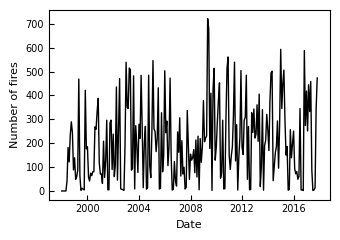

Paraiba


,state,date,number
239,Paraiba,1998-01-01,0.00
240,Paraiba,1998-02-01,0.00
241,Paraiba,1998-03-01,0.00
242,Paraiba,1998-04-01,0.00
243,Paraiba,1998-05-01,0.00
...,...,...,...
473,Paraiba,2017-07-01,446.50
474,Paraiba,2017-08-01,495.00
475,Paraiba,2017-09-01,15.85
476,Paraiba,2017-10-01,128.50


(239, 3)


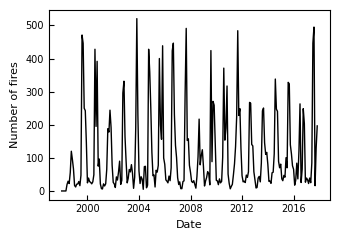

Sao Paulo


,state,date,number
478,Sao Paulo,1998-01-01,0.00
479,Sao Paulo,1998-02-01,0.00
480,Sao Paulo,1998-03-01,0.00
481,Sao Paulo,1998-04-01,0.00
482,Sao Paulo,1998-05-01,0.00
...,...,...,...
712,Sao Paulo,2017-07-01,802.00
713,Sao Paulo,2017-08-01,981.00
714,Sao Paulo,2017-09-01,2.87
715,Sao Paulo,2017-10-01,179.00


(239, 3)


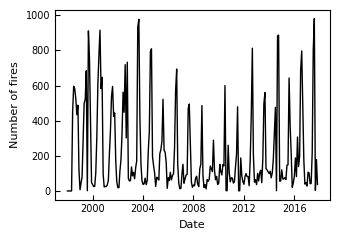

In [37]:
for b in fires_dataset['state'].unique():
    print(b)
    subset = fires_dataset[fires_dataset['state'] == b]
    display(subset)
    print(subset.shape)
    plt.figure(figsize=(3.5, 2.5))

    plt.plot(
        subset['date'],
        subset['number'],
        color='black',
        linestyle='-',
        linewidth=1
    )
    
    plt.xlabel('Date', fontsize=8)
    plt.ylabel('Number of fires', fontsize=8)
    
    plt.tick_params(axis='both', which='major', labelsize=7, direction='in')
    plt.grid(False)  
    
    plt.tight_layout()
    plt.show()


In [38]:
for b in fires_dataset['state'].unique():
    subset = fires_dataset[fires_dataset['state'] == b]
    results = adfuller(subset['number'], maxlag = 12, autolag=None)
    print("ADF for ",b, " states")
    print(results)

# Only bahia are closest - but all are non-stationary

ADF for  Mato Grosso  states
(-3.0838536410552675, 0.027771396709822874, 12, 226, {'1%': -3.4596204846395824, '5%': -2.8744153028455948, '10%': -2.5736320761218576})
ADF for  Paraiba  states
(-3.7213198017075717, 0.003823072201924232, 12, 226, {'1%': -3.4596204846395824, '5%': -2.8744153028455948, '10%': -2.5736320761218576})
ADF for  Sao Paulo  states
(-1.7628794726678483, 0.3990404209384634, 12, 226, {'1%': -3.4596204846395824, '5%': -2.8744153028455948, '10%': -2.5736320761218576})


# Apply RNN

In [39]:
#!pip install torch
import torch
import torch.nn as nn
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.metrics import accuracy_score, f1_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from itertools import product
from sklearn.model_selection import TimeSeriesSplit
import torch.nn.functional as F
import json

## Elman recurrent neural network

### Implementation

In [40]:
class ElmanRNN(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, num_classes):
        super(ElmanRNN, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.rnn = nn.RNN(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, num_classes)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size)
        out, _ = self.rnn(x, h0)
        out = self.fc(out[:, -1, :])
        return out

In [41]:
def train_evaluate_elman_full(X_train, y_train, X_test, y_test, window_size=5,
                              hidden_size=128, lrate=0.0001, input = 1, output = 1, epochs=500, patience = 10, task_type = 'regression'):

    X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
    X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.float32)
    y_test_tensor = torch.tensor(y_test, dtype=torch.float32)

    if X_train_tensor.ndim == 2:
        X_train_tensor = X_train_tensor.unsqueeze(1)
        X_test_tensor = X_test_tensor.unsqueeze(1)

    if y_train_tensor.ndim == 1:
        y_train_tensor = y_train_tensor.unsqueeze(1)
        y_test_tensor = y_test_tensor.unsqueeze(1)

    print("X_train_tensor shape:", X_train_tensor.shape)
    print("y_train_tensor shape:", y_train_tensor.shape)

    # -------------------------
    # Initialize network
    # -------------------------
    # Define the network parameters
    input_size = input*window_size
    num_layers = 1
    num_classes = output

    # Create the network
    model = ElmanRNN(input_size, hidden_size, num_layers, num_classes)

    # Define the loss function and optimization algorithm
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

    # Train the network on the data
    best_test_loss = np.inf
    counter = 0

    for epoch in range(epochs):
        # --- Training ---
        model.train()
        inputs = X_train_tensor
        targets = y_train_tensor

        outputs = model(inputs)
        loss = criterion(outputs, targets)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # --- Evaluate on test set ---
        model.eval()
        with torch.no_grad():
            test_outputs = model(X_test_tensor)
            test_loss = mean_squared_error(y_test_tensor.numpy().flatten(),
                                           test_outputs.numpy().flatten())

        # --- Early stopping check ---
        if test_loss < best_test_loss:
            best_test_loss = test_loss
            counter = 0
            best_model_state = model.state_dict()  # save the best model
        else:
            counter += 1

        if counter >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break

        # --- Print progress every 10 epochs ---
        if (epoch+1) % 10 == 0:
            print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {loss.item():.4f}, Test MSE: {test_loss:.4f}")

    # Load the best model
    model.load_state_dict(best_model_state)

    model.eval()
    
    with torch.no_grad():
        train_pred = model(X_train_tensor)
        test_pred = model(X_test_tensor)
    
        if task_type == "regression":
            # --- Training metrics ---
            train_pred_np = train_pred.numpy().flatten()
            train_targets_np = y_train_tensor.numpy().flatten()
    
            train_mse = mean_squared_error(train_targets_np, train_pred_np)
            train_rmse = np.sqrt(train_mse)
            train_mae = mean_absolute_error(train_targets_np, train_pred_np)
            train_r2 = r2_score(train_targets_np, train_pred_np)
    
            # --- Test metrics ---
            test_pred_np = test_pred.numpy().flatten()
            test_targets_np = y_test_tensor.numpy().flatten()
    
            test_mse = mean_squared_error(test_targets_np, test_pred_np)
            test_rmse = np.sqrt(test_mse)
            test_mae = mean_absolute_error(test_targets_np, test_pred_np)
            test_r2 = r2_score(test_targets_np, test_pred_np)
    
            print("Training Metrics:")
            print(f"MSE: {train_mse:.4f}, RMSE: {train_rmse:.4f}, MAE: {train_mae:.4f}, R2: {train_r2:.4f}")
            print("\nTest Metrics:")
            print(f"MSE: {test_mse:.4f}, RMSE: {test_rmse:.4f}, MAE: {test_mae:.4f}, R2: {test_r2:.4f}")
    
            metrics = {
                'train': {'RMSE': train_rmse, 'MAE': train_mae, 'R2': train_r2},
                'test': {'RMSE': test_rmse, 'MAE': test_mae, 'R2': test_r2}
            }
    
        else:  # classification
            # Convert logits → predicted classes
            train_pred_classes = torch.argmax(train_pred, dim=1).numpy()  
            train_targets_np = torch.argmax(y_train_tensor, dim=1).numpy()    
            test_pred_classes = torch.argmax(test_pred, dim=1).numpy()
            test_targets_np = torch.argmax(y_test_tensor, dim=1).numpy() 
    
            # Training metrics
            train_acc = accuracy_score(train_targets_np, train_pred_classes)
            train_f1 = f1_score(train_targets_np, train_pred_classes, average='weighted')
    
            # Test metrics
            test_acc = accuracy_score(test_targets_np, test_pred_classes)
            test_f1 = f1_score(test_targets_np, test_pred_classes, average='weighted')
    
            print("Training Metrics:")
            print(f"Accuracy: {train_acc:.4f}, F1-score: {train_f1:.4f}")
            print("\nTest Metrics:")
            print(f"Accuracy: {test_acc:.4f}, F1-score: {test_f1:.4f}")
    
            metrics = {
                'train': {'Accuracy': train_acc, 'F1': train_f1},
                'test': {'Accuracy': test_acc, 'F1': test_f1}
            }
    return metrics

In [42]:
def default(o):
    if isinstance(o, (np.float32, np.float64)):
        return float(o)
    if isinstance(o, (np.int32, np.int64)):
        return int(o)
    if isinstance(o, (np.ndarray,)):
        return o.tolist()
    raise TypeError(f"Object of type {type(o)} is not JSON serializable")

### Population

In [43]:
# CV validate to tune hyperparameters

window_sizes = [1, 6, 12, 18]
learning_rates = [0.1, 0.001, 0.001, 0.0001]
hidden_layer_sizes = [16, 32,64, 128, 254]

# To store all results
results = []

# Loop through all hyperparameter combinations
for window_size, lr, hidden_size in product(window_sizes, learning_rates, hidden_layer_sizes):
    # -------------------------
    # Sliding window
    # -------------------------
    X, y = [], []
    for i in range(len(population_dataset['growth']) - window_size):
        X.append(population_dataset['growth'][i:i+window_size])
        y.append(population_dataset['growth'][i+window_size])

    X = np.array(X)
    y = np.array(y)

    # -------------------------
    # Time series cross-validation
    # -------------------------
    tscv = TimeSeriesSplit(n_splits=5)  # Cross validation of 5 datasets

    splits = []
    for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # Standardise
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        splits.append((X_train, X_test, y_train, y_test))
        print(f"Fold {fold+1}: train={len(train_idx)}, test={len(test_idx)}")

    all_metrics = []

    for X_train, X_test, y_train, y_test in splits:
        result = train_evaluate_elman_full(X_train, y_train, X_test, y_test, window_size, hidden_size, lr)
        all_metrics.append(result)


   # Aggregate metrics across folds
    agg_metrics = {}
    for split_key in ['train', 'test']:
        agg_metrics[split_key] = {}
        for metric_key in all_metrics[0][split_key].keys():
            values = [m[split_key][metric_key] for m in all_metrics]
            agg_metrics[split_key][metric_key] = {
                'mean': np.mean(values),
                'std': np.std(values),
                'per_fold': values
            }

    # Save results for this hyperparameter combo
    results.append({
        'window_size': window_size,
        'learning_rate': lr,
        'hidden_layer_size': hidden_size,
        'metrics': agg_metrics
    })

with open("results/elman_population.json", "w") as f:
    json.dump(results, f, indent=2, default=default)

Fold 1: train=139, test=135
Fold 2: train=274, test=135
Fold 3: train=409, test=135
Fold 4: train=544, test=135
Fold 5: train=679, test=135
X_train_tensor shape: torch.Size([139, 1, 1])
y_train_tensor shape: torch.Size([139, 1])
Epoch [10/500], Train Loss: 0.0038, Test MSE: 0.0014
Early stopping at epoch 13
Training Metrics:
MSE: 0.0004, RMSE: 0.0199, MAE: 0.0199, R2: -0.2872

Test Metrics:
MSE: 0.0010, RMSE: 0.0312, MAE: 0.0302, R2: -2.3218
X_train_tensor shape: torch.Size([274, 1, 1])
y_train_tensor shape: torch.Size([274, 1])
Epoch [10/500], Train Loss: 0.0136, Test MSE: 0.0059
Epoch [20/500], Train Loss: 0.0038, Test MSE: 0.0029
Early stopping at epoch 25
Training Metrics:
MSE: 0.0002, RMSE: 0.0151, MAE: 0.0131, R2: 0.7270

Test Metrics:
MSE: 0.0006, RMSE: 0.0235, MAE: 0.0227, R2: -2.1129
X_train_tensor shape: torch.Size([409, 1, 1])
y_train_tensor shape: torch.Size([409, 1])
Epoch [10/500], Train Loss: 0.0163, Test MSE: 0.0182
Early stopping at epoch 15
Training Metrics:
MSE: 0.00

### Stocks

In [44]:
# CV validate to tune hyperparameters

window_sizes = [1, 5, 15, 30]
learning_rates = [0.1, 0.01, 0.001, 0.0001]
hidden_layer_sizes = [16, 32, 64, 128, 254]
# To store all results
results = []

# Loop through all hyperparameter combinations
for window_size, lr, hidden_size in product(window_sizes, learning_rates, hidden_layer_sizes):
    # -------------------------
    # Sliding window
    # -------------------------
    X, y = [], []
    values = stock_full_dataset['returns'].values
    for i in range(len(values) - window_size):
        X.append(values[i:i+window_size])
        y.append(values[i+window_size])

    X = np.array(X)
    y = np.array(y)

    # -------------------------
    # Time series cross-validation
    # -------------------------
    tscv = TimeSeriesSplit(n_splits=5)  # Cross validation of 5 datasets

    splits = []
    for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # Standardise
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

#        y_min, y_max = y_train.min(), y_train.max()
#        y_train_scaled = 2 * (y_train - y_min) / (y_max - y_min) - 1
#        y_test_scaled  = 2 * (y_test - y_min) / (y_max - y_min) - 1

        splits.append((X_train, X_test, y_train, y_test))
        print(f"Fold {fold+1}: train={len(train_idx)}, test={len(test_idx)}")

    all_metrics = []

    for X_train, X_test, y_train, y_test in splits:
        result = train_evaluate_elman_full(X_train, y_train, X_test, y_test, window_size, hidden_size, lr)
        all_metrics.append(result)


   # Aggregate metrics across folds
    agg_metrics = {}
    for split_key in ['train', 'test']:
        agg_metrics[split_key] = {}
        for metric_key in all_metrics[0][split_key].keys():
            values = [m[split_key][metric_key] for m in all_metrics]
            agg_metrics[split_key][metric_key] = {
                'mean': np.mean(values),
                'std': np.std(values),
                'per_fold': values
            }

    # Save results for this hyperparameter combo
    results.append({
        'window_size': window_size,
        'learning_rate': lr,
        'hidden_layer_size': hidden_size,
        'metrics': agg_metrics
    })

with open("results/elman_stocks.json", "w") as f:
    json.dump(results, f, indent=2, default=default)

Fold 1: train=210, test=208
Fold 2: train=418, test=208
Fold 3: train=626, test=208
Fold 4: train=834, test=208
Fold 5: train=1042, test=208
X_train_tensor shape: torch.Size([210, 1, 1])
y_train_tensor shape: torch.Size([210, 1])
Epoch [10/500], Train Loss: 8.0556, Test MSE: 1.8121
Early stopping at epoch 12
Training Metrics:
MSE: 7.8733, RMSE: 2.8059, MAE: 1.9096, R2: 0.0964

Test Metrics:
MSE: 1.8263, RMSE: 1.3514, MAE: 1.0385, R2: -0.0275
X_train_tensor shape: torch.Size([418, 1, 1])
y_train_tensor shape: torch.Size([418, 1])
Epoch [10/500], Train Loss: 5.0513, Test MSE: 3.7699
Early stopping at epoch 16
Training Metrics:
MSE: 4.8655, RMSE: 2.2058, MAE: 1.4795, R2: 0.0754

Test Metrics:
MSE: 3.8987, RMSE: 1.9745, MAE: 1.5416, R2: -0.0418
X_train_tensor shape: torch.Size([626, 1, 1])
y_train_tensor shape: torch.Size([626, 1])
Epoch [10/500], Train Loss: 4.4762, Test MSE: 5.0278
Early stopping at epoch 11
Training Metrics:
MSE: 4.4734, RMSE: 2.1150, MAE: 1.4957, R2: 0.0620

Test Metri

### Weather

In [45]:
window_sizes = [1, 15, 30]
learning_rates = [0.1, 0.01, 0.001, 0.0001]
hidden_layer_sizes = [16, 32, 64, 128, 256]

# To store all results
results = []

# Loop through all hyperparameter combinations
for window_size, lr, hidden_size in product(window_sizes, learning_rates, hidden_layer_sizes):
    # -------------------------
    # Sliding window
    # -------------------------
    X, y = [], []
    weather_dataset = weather_dataset_encoded.sort_values("Date")

    # Prepare inputs and targets
    input_data = weather_dataset_encoded.drop(columns=["Country", "Date"]).values
    weather = weather_dataset_encoded[['Weather_Rainy', 'Weather_Cloudy', 'Weather_Sunny', 'Weather_Windy']].values
    print('weather' ,weather.shape)
    for i in range(len(input_data) - window_size):
        X.append(input_data[i:i+window_size].flatten())
        y.append(weather[i+window_size])
        

    X = np.array(X)
    y = np.array(y)
    print('y', y.shape)

    # -------------------------
    # Time series cross-validation
    # -------------------------
    tscv = TimeSeriesSplit(n_splits=5)  # Cross validation of 5 datasets

    splits = []
    for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        print(y_train.shape, 'train')

        # Standardise
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        if X_train.shape[-1] == 1:
            X_train = X_train.squeeze(-1)
            X_test  = X_test.squeeze(-1)

        splits.append((X_train, X_test, y_train, y_test))
        print(f"Fold {fold+1}: train={len(train_idx)}, test={len(test_idx)}")

    all_metrics = []

    for X_train, X_test, y_train, y_test in splits:
        print('train  d' ,y_train.shape)
        result = train_evaluate_elman_full(X_train, y_train, X_test, y_test, window_size, hidden_size, lr, input = 11, output = 4, task_type="classification")
        all_metrics.append(result)

   # Aggregate metrics across folds
    agg_metrics = {}
    for split_key in ['train', 'test']:
        agg_metrics[split_key] = {}
        for metric_key in all_metrics[0][split_key].keys():
            values = [m[split_key][metric_key] for m in all_metrics]
            agg_metrics[split_key][metric_key] = {
                'mean': np.mean(values),
                'std': np.std(values),
                'per_fold': values
            }

    # Save results for this hyperparameter combo
    results.append({
        'window_size': window_size,
        'learning_rate': lr,
        'hidden_layer_size': hidden_size,
        'metrics': agg_metrics
    })

with open("results/elman_weather.json", "w") as f:
    json.dump(results, f, indent=2, default=default)

weather (2190, 4)
y (2189, 4)
(369, 4) train
Fold 1: train=369, test=364
(733, 4) train
Fold 2: train=733, test=364
(1097, 4) train
Fold 3: train=1097, test=364
(1461, 4) train
Fold 4: train=1461, test=364
(1825, 4) train
Fold 5: train=1825, test=364
train  d (369, 4)
X_train_tensor shape: torch.Size([369, 1, 11])
y_train_tensor shape: torch.Size([369, 4])
Epoch [10/500], Train Loss: 0.1290, Test MSE: 0.1101
Epoch [20/500], Train Loss: 0.1155, Test MSE: 0.0994
Epoch [30/500], Train Loss: 0.1023, Test MSE: 0.0948
Early stopping at epoch 39
Training Metrics:
Accuracy: 0.7344, F1-score: 0.6322

Test Metrics:
Accuracy: 0.7692, F1-score: 0.6786
train  d (733, 4)
X_train_tensor shape: torch.Size([733, 1, 11])
y_train_tensor shape: torch.Size([733, 4])
Epoch [10/500], Train Loss: 0.1305, Test MSE: 0.1154
Epoch [20/500], Train Loss: 0.1098, Test MSE: 0.1049
Epoch [30/500], Train Loss: 0.0971, Test MSE: 0.0922
Epoch [40/500], Train Loss: 0.0959, Test MSE: 0.0906
Early stopping at epoch 50
Train

### Property Sales

In [46]:
window_sizes = [1, 6, 12, 18]
learning_rates = [0.1, 0.01, 0.001, 0.0001]
hidden_layer_sizes = [16, 32, 64, 128, 256]

# To store all results
results = []

# Loop through all hyperparameter combinations
for window_size, lr, hidden_size in product(window_sizes, learning_rates, hidden_layer_sizes):
    # -------------------------
    # Sliding window
    # -------------------------
    X, y = [], []
    property_dataset = property_dataset.sort_values("saledate")

    # Prepare inputs and targets
    input_data = property_dataset.drop(columns=["saledate", "type"]).values
    price = property_dataset['MA'].values

    for i in range(len(input_data) - window_size):
        X.append(input_data[i:i+window_size].flatten())
        y.append(price[i+window_size])

    X = np.array(X)
    y = np.array(y)

    # -------------------------
    # Time series cross-validation
    # -------------------------
    tscv = TimeSeriesSplit(n_splits=5)  # Cross validation of 5 datasets

    splits = []
    for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # Standardise
        scaler = StandardScaler()
        print(X_train.size)
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        if X_train.shape[-1] == 1:
            X_train = X_train.squeeze(-1)
            X_test  = X_test.squeeze(-1)

#        y_min, y_max = y_train.min(), y_train.max()
#        y_train_scaled = 2 * (y_train - y_min) / (y_max - y_min) - 1
#        y_test_scaled  = 2 * (y_test - y_min) / (y_max - y_min) - 1

        splits.append((X_train, X_test, y_train, y_test))
        print(f"Fold {fold+1}: train={len(train_idx)}, test={len(test_idx)}")

    all_metrics = []

    for X_train, X_test, y_train, y_test in splits:
        result = train_evaluate_elman_full(X_train, y_train, X_test, y_test, window_size, hidden_size, lr, input = 2, output = 1)
        all_metrics.append(result)

   # Aggregate metrics across folds
    agg_metrics = {}
    for split_key in ['train', 'test']:
        agg_metrics[split_key] = {}
        for metric_key in all_metrics[0][split_key].keys():
            values = [m[split_key][metric_key] for m in all_metrics]
            agg_metrics[split_key][metric_key] = {
                'mean': np.mean(values),
                'std': np.std(values),
                'per_fold': values
            }

    # Save results for this hyperparameter combo
    results.append({
        'window_size': window_size,
        'learning_rate': lr,
        'hidden_layer_size': hidden_size,
        'metrics': agg_metrics
    })

with open("results/elman_property.json", "w") as f:
    json.dump(results, f, indent=2, default=default)

68
Fold 1: train=34, test=33
134
Fold 2: train=67, test=33
200
Fold 3: train=100, test=33
266
Fold 4: train=133, test=33
332
Fold 5: train=166, test=33
X_train_tensor shape: torch.Size([34, 1, 2])
y_train_tensor shape: torch.Size([34, 1])
Epoch [10/500], Train Loss: 308851802112.0000, Test MSE: 347688534016.0000
Epoch [20/500], Train Loss: 308850458624.0000, Test MSE: 347687092224.0000
Epoch [30/500], Train Loss: 308848754688.0000, Test MSE: 347685257216.0000
Epoch [40/500], Train Loss: 308846624768.0000, Test MSE: 347682930688.0000
Epoch [50/500], Train Loss: 308844199936.0000, Test MSE: 347680309248.0000
Epoch [60/500], Train Loss: 308841545728.0000, Test MSE: 347677556736.0000
Epoch [70/500], Train Loss: 308838793216.0000, Test MSE: 347674574848.0000
Epoch [80/500], Train Loss: 308836106240.0000, Test MSE: 347671691264.0000
Epoch [90/500], Train Loss: 308833517568.0000, Test MSE: 347668938752.0000
Epoch [100/500], Train Loss: 308831027200.0000, Test MSE: 347666284544.0000
Epoch [110

### Fires

In [47]:
# CV validate to tune hyperparameters

window_sizes = [1, 6, 12, 18]
learning_rates = [0.1, 0.01, 0.001, 0.0001]
hidden_layer_sizes = [16, 32, 64, 128, 256]

# To store all results
results = []

# Loop through all hyperparameter combinations
for window_size, lr, hidden_size in product(window_sizes, learning_rates, hidden_layer_sizes):
    # -------------------------
    # Sliding window
    # -------------------------
    X, y = [], []
    values = fires_dataset_wide.drop(columns=["date"]).values

    for i in range(len(values) - window_size):
        X.append(values[i:i+window_size].flatten())
        y.append(values[i+window_size])

    X = np.array(X)
    y = np.array(y)

    # -------------------------
    # Time series cross-validation
    # -------------------------
    tscv = TimeSeriesSplit(n_splits=5)  # Cross validation of 5 datasets

    splits = []
    for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # Standardise
        scaler = StandardScaler()
        print(X_train.size)
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        if X_train.shape[-1] == 1:
            X_train = X_train.squeeze(-1)
            X_test  = X_test.squeeze(-1)

        splits.append((X_train, X_test, y_train, y_test))
        print(f"Fold {fold+1}: train={len(train_idx)}, test={len(test_idx)}")

    all_metrics = []

    for X_train, X_test, y_train, y_test in splits:
        result = train_evaluate_elman_full(X_train, y_train, X_test, y_test, window_size, hidden_size, lr, input = 3, output = 3)
        all_metrics.append(result)

   # Aggregate metrics across folds
    agg_metrics = {}
    for split_key in ['train', 'test']:
        agg_metrics[split_key] = {}
        for metric_key in all_metrics[0][split_key].keys():
            values = [m[split_key][metric_key] for m in all_metrics]
            agg_metrics[split_key][metric_key] = {
                'mean': np.mean(values),
                'std': np.std(values),
                'per_fold': values
            }

    # Save results for this hyperparameter combo
    results.append({
        'window_size': window_size,
        'learning_rate': lr,
        'hidden_layer_size': hidden_size,
        'metrics': agg_metrics
    })

with open("results/elman_fires.json", "w") as f:
    json.dump(results, f, indent=2, default=default)

129
Fold 1: train=43, test=39
246
Fold 2: train=82, test=39
363
Fold 3: train=121, test=39
480
Fold 4: train=160, test=39
597
Fold 5: train=199, test=39
X_train_tensor shape: torch.Size([43, 1, 3])
y_train_tensor shape: torch.Size([43, 3])
Epoch [10/500], Train Loss: 78537.6406, Test MSE: 84921.2656
Epoch [20/500], Train Loss: 78140.4844, Test MSE: 84487.8125
Epoch [30/500], Train Loss: 77544.0859, Test MSE: 83850.9766
Epoch [40/500], Train Loss: 76807.0625, Test MSE: 83068.7578
Epoch [50/500], Train Loss: 75996.2500, Test MSE: 82180.9922
Epoch [60/500], Train Loss: 75165.2891, Test MSE: 81245.6953
Epoch [70/500], Train Loss: 74350.7188, Test MSE: 80314.0000
Epoch [80/500], Train Loss: 73573.7656, Test MSE: 79418.3125
Epoch [90/500], Train Loss: 72837.5625, Test MSE: 78572.6250
Epoch [100/500], Train Loss: 72144.4297, Test MSE: 77771.5781
Epoch [110/500], Train Loss: 71485.4609, Test MSE: 77008.0234
Epoch [120/500], Train Loss: 70855.0078, Test MSE: 76279.1641
Epoch [130/500], Train Lo

## Jordan recurrent neural network

### Implementation

Hyperparameters:
- Window size (sequence length)
- learning rate
- momentum
- Hidden layer size

In [48]:
class JordanRNN(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, num_classes):
        super(JordanRNN, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.num_classes = num_classes
        # The input to the RNN is the current input features concatenated with the previous output
        self.rnn = nn.RNN(input_size + num_classes, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, num_classes)

    def forward(self, x):
        #print("\n[DEBUG] JordanRNN.forward called")
        #print("[DEBUG] Input to forward:", x.shape)
        #print("[DEBUG] self.rnn.input_size (expected feature dim):", self.rnn.input_size)


        batch_size, seq_len, input_features = x.size()
        device = x.device

        h0 = torch.zeros(self.num_layers, batch_size, self.hidden_size, device=device)
        prev_output = torch.zeros(batch_size, self.num_classes, device=device)

        outputs = []
        for t in range(seq_len):
            # Concatenate current input features with previous output
            rnn_input = torch.cat((x[:, t, :], prev_output), dim=1).unsqueeze(1)
            out, h0 = self.rnn(rnn_input, h0)
            out_step = self.fc(out[:, -1, :])
            outputs.append(out_step.unsqueeze(1))
            prev_output = out_step

        outputs = torch.cat(outputs, dim=1)
        return outputs[:, -1, :]

In [49]:
def train_evaluate_jordan_full(X_train, y_train, X_test, y_test, window_size=5,
                              hidden_size=128, lrate=0.0001, input_dim = 1, output = 1, epochs=500, patience = 10, task_type ="regression"):

    X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
    X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.float32)
    y_test_tensor = torch.tensor(y_test, dtype=torch.float32)

    # Ensure input tensors have shape (batch_size, window_size, input_dim)
    if X_train_tensor.ndim == 2:
        X_train_tensor = X_train_tensor.unsqueeze(1) # Add input_dim dimension
    if X_test_tensor.ndim == 2:
        X_test_tensor = X_test_tensor.unsqueeze(1)

    if y_train_tensor.ndim == 1:
        y_train_tensor = y_train_tensor.unsqueeze(1)
    if y_test_tensor.ndim == 1:
        y_test_tensor = y_test_tensor.unsqueeze(1)


    # -------------------------
    # Initialize network
    # -------------------------
    # Define the network parameters
    # input_size is now the feature dimension of the input at each time step
    input_size = input_dim * window_size
    num_layers = 1
    num_classes = output

    # Create the network
    model = JordanRNN(input_size, hidden_size, num_layers, num_classes)

    # Define the loss function and optimization algorithm
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lrate) # Use the learning rate from hyperparameters

    # Train the network on the data
    best_test_loss = np.inf
    counter = 0

    for epoch in range(epochs):
        # --- Training ---
        model.train()
        inputs = X_train_tensor
        #print("inputs", inputs.size(-1))
        targets = y_train_tensor


        outputs = model(inputs)
        loss = criterion(outputs, targets)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # --- Evaluate on test set ---
        model.eval()
        with torch.no_grad():
            test_outputs = model(X_test_tensor)
            test_loss = mean_squared_error(y_test_tensor.numpy().flatten(),
                                           test_outputs.numpy().flatten())

        # --- Early stopping check ---
        if test_loss < best_test_loss:
            best_test_loss = test_loss
            counter = 0
            best_model_state = model.state_dict()  # save the best model
        else:
            counter += 1

        if counter >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break

        # --- Print progress every 10 epochs ---
        if (epoch+1) % 10 == 0:
            print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {loss.item():.4f}, Test MSE: {test_loss:.4f}")

    # Load the best model
    model.load_state_dict(best_model_state)

    model.eval()

    with torch.no_grad():
        train_pred = model(X_train_tensor)
        test_pred = model(X_test_tensor)
    
        if task_type == "regression":
            # --- Training metrics ---
            train_pred_np = train_pred.numpy().flatten()
            train_targets_np = y_train_tensor.numpy().flatten()
    
            train_mse = mean_squared_error(train_targets_np, train_pred_np)
            train_rmse = np.sqrt(train_mse)
            train_mae = mean_absolute_error(train_targets_np, train_pred_np)
            train_r2 = r2_score(train_targets_np, train_pred_np)
    
            # --- Test metrics ---
            test_pred_np = test_pred.numpy().flatten()
            test_targets_np = y_test_tensor.numpy().flatten()
    
            test_mse = mean_squared_error(test_targets_np, test_pred_np)
            test_rmse = np.sqrt(test_mse)
            test_mae = mean_absolute_error(test_targets_np, test_pred_np)
            test_r2 = r2_score(test_targets_np, test_pred_np)
    
            print("Training Metrics:")
            print(f"MSE: {train_mse:.4f}, RMSE: {train_rmse:.4f}, MAE: {train_mae:.4f}, R2: {train_r2:.4f}")
            print("\nTest Metrics:")
            print(f"MSE: {test_mse:.4f}, RMSE: {test_rmse:.4f}, MAE: {test_mae:.4f}, R2: {test_r2:.4f}")
    
            metrics = {
                'train': {'RMSE': train_rmse, 'MAE': train_mae, 'R2': train_r2},
                'test': {'RMSE': test_rmse, 'MAE': test_mae, 'R2': test_r2}
            }
    
        else:  # classification
            # Convert logits → predicted classes
            train_pred_classes = torch.argmax(train_pred, dim=1).numpy()  
            train_targets_np = torch.argmax(y_train_tensor, dim=1).numpy()    
            test_pred_classes = torch.argmax(test_pred, dim=1).numpy()
            test_targets_np = torch.argmax(y_test_tensor, dim=1).numpy() 
    
            # Training metrics
            train_acc = accuracy_score(train_targets_np, train_pred_classes)
            train_f1 = f1_score(train_targets_np, train_pred_classes, average='weighted')
    
            # Test metrics
            test_acc = accuracy_score(test_targets_np, test_pred_classes)
            test_f1 = f1_score(test_targets_np, test_pred_classes, average='weighted')
    
            print("Training Metrics:")
            print(f"Accuracy: {train_acc:.4f}, F1-score: {train_f1:.4f}")
            print("\nTest Metrics:")
            print(f"Accuracy: {test_acc:.4f}, F1-score: {test_f1:.4f}")
    
            metrics = {
                'train': {'Accuracy': train_acc, 'F1': train_f1},
                'test': {'Accuracy': test_acc, 'F1': test_f1}
            }
    return metrics

### Population

In [50]:
# CV validate to tune hyperparameters

window_sizes = [1, 6, 12, 18]
learning_rates = [0.1, 0.001, 0.001, 0.0001]
hidden_layer_sizes = [16, 32, 64, 128, 254]

# To store all results
results = []

# Loop through all hyperparameter combinations
for window_size, lr, hidden_size in product(window_sizes, learning_rates, hidden_layer_sizes):
    # -------------------------
    # Sliding window
    # -------------------------
    X, y = [], []
    for i in range(len(population_dataset['growth']) - window_size):
        X.append(population_dataset['growth'][i:i+window_size])
        y.append(population_dataset['growth'][i+window_size])

    X = np.array(X)
    y = np.array(y)

    # -------------------------
    # Time series cross-validation
    # -------------------------
    tscv = TimeSeriesSplit(n_splits=5)  # Cross validation of 5 datasets

    splits = []
    for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # Standardise
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        splits.append((X_train, X_test, y_train, y_test))
        print(f"Fold {fold+1}: train={len(train_idx)}, test={len(test_idx)}")

    all_metrics = []

    for X_train, X_test, y_train, y_test in splits:
        result = train_evaluate_jordan_full(X_train, y_train, X_test, y_test, window_size, hidden_size, lr, input_dim=1, output=1)
        all_metrics.append(result)

   # Aggregate metrics across folds
    agg_metrics = {}
    for split_key in ['train', 'test']:
        agg_metrics[split_key] = {}
        for metric_key in all_metrics[0][split_key].keys():
            values = [m[split_key][metric_key] for m in all_metrics]
            agg_metrics[split_key][metric_key] = {
                'mean': np.mean(values),
                'std': np.std(values),
                'per_fold': values
            }

    # Save results for this hyperparameter combo
    results.append({
        'window_size': window_size,
        'learning_rate': lr,
        'hidden_layer_size': hidden_size,
        'metrics': agg_metrics
    })

with open("results/jordan_population.json", "w") as f:
    json.dump(results, f, indent=2, default=default)

Fold 1: train=139, test=135
Fold 2: train=274, test=135
Fold 3: train=409, test=135
Fold 4: train=544, test=135
Fold 5: train=679, test=135
Epoch [10/500], Train Loss: 0.0076, Test MSE: 0.0819
Early stopping at epoch 15
Training Metrics:
MSE: 0.0296, RMSE: 0.1719, MAE: 0.1682, R2: -94.5925

Test Metrics:
MSE: 0.0144, RMSE: 0.1202, MAE: 0.1191, R2: -48.3556
Epoch [10/500], Train Loss: 0.0306, Test MSE: 0.0031
Early stopping at epoch 12
Training Metrics:
MSE: 0.0188, RMSE: 0.1370, MAE: 0.1300, R2: -21.4145

Test Metrics:
MSE: 0.0343, RMSE: 0.1851, MAE: 0.1834, R2: -192.7176
Epoch [10/500], Train Loss: 0.0105, Test MSE: 0.0209
Epoch [20/500], Train Loss: 0.0036, Test MSE: 0.0019
Early stopping at epoch 23
Training Metrics:
MSE: 0.0034, RMSE: 0.0581, MAE: 0.0501, R2: -2.8836

Test Metrics:
MSE: 0.0019, RMSE: 0.0434, MAE: 0.0397, R2: -5.0498
Epoch [10/500], Train Loss: 0.0013, Test MSE: 0.0123
Epoch [20/500], Train Loss: 0.0013, Test MSE: 0.0005
Early stopping at epoch 24
Training Metrics:


### Stocks

In [51]:
window_sizes = [1, 5, 15, 30]
learning_rates = [0.1, 0.01, 0.001, 0.0001]
hidden_layer_sizes = [16, 32, 64, 128, 254]
# To store all results
results = []

# Loop through all hyperparameter combinations
for window_size, lr, hidden_size in product(window_sizes, learning_rates, hidden_layer_sizes):
    # -------------------------
    # Sliding window
    # -------------------------
    X, y = [], []
    values = stock_full_dataset['returns'].values
    for i in range(len(values) - window_size):
        X.append(values[i:i+window_size])
        y.append(values[i+window_size])

    X = np.array(X)
    y = np.array(y)

    # -------------------------
    # Time series cross-validation
    # -------------------------
    tscv = TimeSeriesSplit(n_splits=5)  # Cross validation of 5 datasets

    splits = []
    for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # Standardise
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

#        y_min, y_max = y_train.min(), y_train.max()
#        y_train_scaled = 2 * (y_train - y_min) / (y_max - y_min) - 1
#        y_test_scaled  = 2 * (y_test - y_min) / (y_max - y_min) - 1

        splits.append((X_train, X_test, y_train, y_test))
        print(f"Fold {fold+1}: train={len(train_idx)}, test={len(test_idx)}")

    all_metrics = []

    for X_train, X_test, y_train, y_test in splits:
        result = train_evaluate_jordan_full(X_train, y_train, X_test, y_test, window_size, hidden_size, lr)
        all_metrics.append(result)


   # Aggregate metrics across folds
    agg_metrics = {}
    for split_key in ['train', 'test']:
        agg_metrics[split_key] = {}
        for metric_key in all_metrics[0][split_key].keys():
            values = [m[split_key][metric_key] for m in all_metrics]
            agg_metrics[split_key][metric_key] = {
                'mean': np.mean(values),
                'std': np.std(values),
                'per_fold': values
            }

    # Save results for this hyperparameter combo
    results.append({
        'window_size': window_size,
        'learning_rate': lr,
        'hidden_layer_size': hidden_size,
        'metrics': agg_metrics
    })

with open("results/jordan_stocks.json", "w") as f:
    json.dump(results, f, indent=2, default=default)

Fold 1: train=210, test=208
Fold 2: train=418, test=208
Fold 3: train=626, test=208
Fold 4: train=834, test=208
Fold 5: train=1042, test=208
Epoch [10/500], Train Loss: 7.3845, Test MSE: 1.9553
Early stopping at epoch 11
Training Metrics:
MSE: 7.2717, RMSE: 2.6966, MAE: 1.8536, R2: 0.1654

Test Metrics:
MSE: 1.9904, RMSE: 1.4108, MAE: 1.0893, R2: -0.1199
Epoch [10/500], Train Loss: 4.6966, Test MSE: 4.1576
Early stopping at epoch 17
Training Metrics:
MSE: 4.5637, RMSE: 2.1363, MAE: 1.4655, R2: 0.1328

Test Metrics:
MSE: 4.0710, RMSE: 2.0177, MAE: 1.5680, R2: -0.0879
Epoch [10/500], Train Loss: 4.4891, Test MSE: 5.1456
Early stopping at epoch 15
Training Metrics:
MSE: 4.4343, RMSE: 2.1058, MAE: 1.4880, R2: 0.0702

Test Metrics:
MSE: 4.9416, RMSE: 2.2230, MAE: 1.7307, R2: -0.0836
Epoch [10/500], Train Loss: 4.6096, Test MSE: 1.7427
Epoch [20/500], Train Loss: 4.5469, Test MSE: 1.6918
Early stopping at epoch 30
Training Metrics:
MSE: 4.4576, RMSE: 2.1113, MAE: 1.5263, R2: 0.0550

Test Met

### Weather

In [52]:
window_sizes = [1, 15, 30]
learning_rates = [0.1, 0.01, 0.001, 0.0001]
hidden_layer_sizes = [16, 32, 64, 128, 256]

# To store all results
results = []

# Loop through all hyperparameter combinations
for window_size, lr, hidden_size in product(window_sizes, learning_rates, hidden_layer_sizes):
    # -------------------------
    # Sliding window
    # -------------------------
    X, y = [], []
    weather_dataset = weather_dataset_encoded.sort_values("Date")

    # Prepare inputs and targets
    input_data = weather_dataset_encoded.drop(columns=["Country", "Date"]).values
    weather = weather_dataset_encoded[['Weather_Rainy', 'Weather_Cloudy', 'Weather_Sunny', 'Weather_Windy']].values
    print('weather' ,weather.shape)
    for i in range(len(input_data) - window_size):
        X.append(input_data[i:i+window_size].flatten())
        y.append(weather[i+window_size])
        

    X = np.array(X)
    y = np.array(y)
    print('y', y.shape)

    # -------------------------
    # Time series cross-validation
    # -------------------------
    tscv = TimeSeriesSplit(n_splits=5)  # Cross validation of 5 datasets

    splits = []
    for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        print(y_train.shape, 'train')

        # Standardise
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        if X_train.shape[-1] == 1:
            X_train = X_train.squeeze(-1)
            X_test  = X_test.squeeze(-1)

        splits.append((X_train, X_test, y_train, y_test))
        print(f"Fold {fold+1}: train={len(train_idx)}, test={len(test_idx)}")

    all_metrics = []

    for X_train, X_test, y_train, y_test in splits:
        print('train  d' ,y_train.shape)
        result = train_evaluate_jordan_full(X_train, y_train, X_test, y_test, window_size, hidden_size, lr, input_dim = 11, output = 4, task_type="classification")
        all_metrics.append(result)

   # Aggregate metrics across folds
    agg_metrics = {}
    for split_key in ['train', 'test']:
        agg_metrics[split_key] = {}
        for metric_key in all_metrics[0][split_key].keys():
            values = [m[split_key][metric_key] for m in all_metrics]
            agg_metrics[split_key][metric_key] = {
                'mean': np.mean(values),
                'std': np.std(values),
                'per_fold': values
            }

    # Save results for this hyperparameter combo
    results.append({
        'window_size': window_size,
        'learning_rate': lr,
        'hidden_layer_size': hidden_size,
        'metrics': agg_metrics
    })

with open("results/jordan_weather.json", "w") as f:
    json.dump(results, f, indent=2, default=default)

weather (2190, 4)
y (2189, 4)
(369, 4) train
Fold 1: train=369, test=364
(733, 4) train
Fold 2: train=733, test=364
(1097, 4) train
Fold 3: train=1097, test=364
(1461, 4) train
Fold 4: train=1461, test=364
(1825, 4) train
Fold 5: train=1825, test=364
train  d (369, 4)
Epoch [10/500], Train Loss: 0.1175, Test MSE: 0.1183
Epoch [20/500], Train Loss: 0.1089, Test MSE: 0.0957
Epoch [30/500], Train Loss: 0.0992, Test MSE: 0.0956
Epoch [40/500], Train Loss: 0.0976, Test MSE: 0.0944
Epoch [50/500], Train Loss: 0.0957, Test MSE: 0.0955
Early stopping at epoch 51
Training Metrics:
Accuracy: 0.7425, F1-score: 0.6447

Test Metrics:
Accuracy: 0.7692, F1-score: 0.6737
train  d (733, 4)
Epoch [10/500], Train Loss: 0.1225, Test MSE: 0.1261
Epoch [20/500], Train Loss: 0.0987, Test MSE: 0.0946
Epoch [30/500], Train Loss: 0.0964, Test MSE: 0.0923
Epoch [40/500], Train Loss: 0.0935, Test MSE: 0.0897
Epoch [50/500], Train Loss: 0.0921, Test MSE: 0.0908
Early stopping at epoch 58
Training Metrics:
Accuracy

### Property Sales

In [53]:
window_sizes = [1, 6, 12, 18]
learning_rates = [0.1, 0.01, 0.001, 0.0001]
hidden_layer_sizes = [16, 32, 64, 128, 256]


# To store all results
results = []

# Loop through all hyperparameter combinations
for window_size, lr, hidden_size in product(window_sizes, learning_rates, hidden_layer_sizes):
    # -------------------------
    # Sliding window
    # -------------------------
    X, y = [], []
    property_dataset = property_dataset.sort_values("saledate")

    # Prepare inputs and targets
    input_data = property_dataset.drop(columns=["saledate", "type"]).values
    price = property_dataset['MA'].values

    for i in range(len(input_data) - window_size):
        X.append(input_data[i:i+window_size].flatten())
        y.append(price[i+window_size])

    X = np.array(X)
    y = np.array(y)

    # -------------------------
    # Time series cross-validation
    # -------------------------
    tscv = TimeSeriesSplit(n_splits=5)  # Cross validation of 5 datasets

    splits = []
    for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # Standardise
        scaler = StandardScaler()
        print(X_train.size)
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        if X_train.shape[-1] == 1:
            X_train = X_train.squeeze(-1)
            X_test  = X_test.squeeze(-1)

#        y_min, y_max = y_train.min(), y_train.max()
#        y_train_scaled = 2 * (y_train - y_min) / (y_max - y_min) - 1
#        y_test_scaled  = 2 * (y_test - y_min) / (y_max - y_min) - 1

        splits.append((X_train, X_test, y_train, y_test))
        print(f"Fold {fold+1}: train={len(train_idx)}, test={len(test_idx)}")

    all_metrics = []

    for X_train, X_test, y_train, y_test in splits:
        result = train_evaluate_jordan_full(X_train, y_train, X_test, y_test, window_size, hidden_size, lr, input_dim = 2, output = 1)
        all_metrics.append(result)

   # Aggregate metrics across folds
    agg_metrics = {}
    for split_key in ['train', 'test']:
        agg_metrics[split_key] = {}
        for metric_key in all_metrics[0][split_key].keys():
            values = [m[split_key][metric_key] for m in all_metrics]
            agg_metrics[split_key][metric_key] = {
                'mean': np.mean(values),
                'std': np.std(values),
                'per_fold': values
            }

    # Save results for this hyperparameter combo
    results.append({
        'window_size': window_size,
        'learning_rate': lr,
        'hidden_layer_size': hidden_size,
        'metrics': agg_metrics
    })

with open("results/jordan_property.json", "w") as f:
    json.dump(results, f, indent=2, default=default)

68
Fold 1: train=34, test=33
134
Fold 2: train=67, test=33
200
Fold 3: train=100, test=33
266
Fold 4: train=133, test=33
332
Fold 5: train=166, test=33
Epoch [10/500], Train Loss: 308838432768.0000, Test MSE: 347672313856.0000
Epoch [20/500], Train Loss: 308818345984.0000, Test MSE: 347650949120.0000
Epoch [30/500], Train Loss: 308798423040.0000, Test MSE: 347629715456.0000
Epoch [40/500], Train Loss: 308778631168.0000, Test MSE: 347608711168.0000
Epoch [50/500], Train Loss: 308759035904.0000, Test MSE: 347587837952.0000
Epoch [60/500], Train Loss: 308739604480.0000, Test MSE: 347567259648.0000
Epoch [70/500], Train Loss: 308720402432.0000, Test MSE: 347546812416.0000
Epoch [80/500], Train Loss: 308701233152.0000, Test MSE: 347526430720.0000
Epoch [90/500], Train Loss: 308682194944.0000, Test MSE: 347506147328.0000
Epoch [100/500], Train Loss: 308663255040.0000, Test MSE: 347485995008.0000
Epoch [110/500], Train Loss: 308644347904.0000, Test MSE: 347465908224.0000
Epoch [120/500], Trai

### Fires

In [54]:
# CV validate to tune hyperparameters

window_sizes = [1, 6, 12, 18]
learning_rates = [0.1, 0.01, 0.001, 0.0001]
hidden_layer_sizes = [16, 32, 64, 128, 256]

# To store all results
results = []

# Loop through all hyperparameter combinations
for window_size, lr, hidden_size in product(window_sizes, learning_rates, hidden_layer_sizes):
    # -------------------------
    # Sliding window
    # -------------------------
    X, y = [], []
    values = fires_dataset_wide.drop(columns=["date"]).values

    for i in range(len(values) - window_size):
        X.append(values[i:i+window_size].flatten())
        y.append(values[i+window_size])

    X = np.array(X)
    y = np.array(y)

    # -------------------------
    # Time series cross-validation
    # -------------------------
    tscv = TimeSeriesSplit(n_splits=5)  # Cross validation of 5 datasets

    splits = []
    for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # Standardise
        scaler = StandardScaler()
        print(X_train.size)
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        if X_train.shape[-1] == 1:
            X_train = X_train.squeeze(-1)
            X_test  = X_test.squeeze(-1)

        splits.append((X_train, X_test, y_train, y_test))
        print(f"Fold {fold+1}: train={len(train_idx)}, test={len(test_idx)}")

    all_metrics = []

    for X_train, X_test, y_train, y_test in splits:
        result = train_evaluate_jordan_full(X_train, y_train, X_test, y_test, window_size, hidden_size, lr, input_dim = 3, output = 3)
        all_metrics.append(result)

   # Aggregate metrics across folds
    agg_metrics = {}
    for split_key in ['train', 'test']:
        agg_metrics[split_key] = {}
        for metric_key in all_metrics[0][split_key].keys():
            values = [m[split_key][metric_key] for m in all_metrics]
            agg_metrics[split_key][metric_key] = {
                'mean': np.mean(values),
                'std': np.std(values),
                'per_fold': values
            }

    # Save results for this hyperparameter combo
    results.append({
        'window_size': window_size,
        'learning_rate': lr,
        'hidden_layer_size': hidden_size,
        'metrics': agg_metrics
    })

with open("results/jordan_fires.json", "w") as f:
    json.dump(results, f, indent=2, default=default)

129
Fold 1: train=43, test=39
246
Fold 2: train=82, test=39
363
Fold 3: train=121, test=39
480
Fold 4: train=160, test=39
597
Fold 5: train=199, test=39
Epoch [10/500], Train Loss: 74879.6328, Test MSE: 80394.0938
Epoch [20/500], Train Loss: 69372.3516, Test MSE: 74075.5625
Epoch [30/500], Train Loss: 64369.3828, Test MSE: 68439.7812
Epoch [40/500], Train Loss: 60079.0430, Test MSE: 63507.7266
Epoch [50/500], Train Loss: 56565.2891, Test MSE: 59463.4961
Epoch [60/500], Train Loss: 53667.2148, Test MSE: 56192.2070
Epoch [70/500], Train Loss: 50962.5430, Test MSE: 53706.6953
Epoch [80/500], Train Loss: 48685.8477, Test MSE: 51661.8203
Epoch [90/500], Train Loss: 46146.4023, Test MSE: 50411.9141
Epoch [100/500], Train Loss: 43764.3750, Test MSE: 48080.5781
Epoch [110/500], Train Loss: 41589.9648, Test MSE: 47185.0469
Epoch [120/500], Train Loss: 39630.7852, Test MSE: 46712.4883
Epoch [130/500], Train Loss: 37871.3828, Test MSE: 45369.8359
Epoch [140/500], Train Loss: 36293.6875, Test MSE:

## Multi-recurrent neural network

### Implementation

In [55]:
class MultiRNN(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, num_classes):
        super(MultiRNN, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.num_classes = num_classes

        # Input: current features + previous hidden + previous output
        self.rnn_input_size = input_size + hidden_size + num_classes
        self.rnn = nn.RNN(self.rnn_input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, num_classes)

    def forward(self, x):
        """
        x: (batch_size, seq_len, input_size)
        """
        batch_size, seq_len, input_size = x.size()
        device = x.device

        # Initialize hidden state
        h_t = torch.zeros(self.num_layers, batch_size, self.hidden_size, device=device, dtype=x.dtype)
        # Initialize previous output as zeros
        prev_output = torch.zeros(batch_size, self.num_classes, device=device, dtype=x.dtype)

        outputs = []
        for t in range(seq_len):
            # Concatenate current input, previous hidden (last layer), and previous output
            rnn_input = torch.cat((x[:, t, :], h_t[-1], prev_output), dim=1).unsqueeze(1)
            out, h_t = self.rnn(rnn_input, h_t)

            # Project hidden state to output
            out_step = self.fc(out[:, -1, :])
            outputs.append(out_step.unsqueeze(1))

            # Update prev_output for next timestep
            prev_output = out_step

        # Concatenate predictions across timesteps
        outputs = torch.cat(outputs, dim=1)
        return outputs[:, -1, :]  # return last output

In [56]:
def train_evaluate_multi_full(X_train, y_train, X_test, y_test, window_size=5, hidden_size=128, lrate=0.0001, input_dim=1, output=1, epochs=500, patience=10, task_type = "regression"):

    # -------------------------
    # Convert data to tensors
    # -------------------------
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
    X_test_tensor  = torch.tensor(X_test, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.float32)
    y_test_tensor  = torch.tensor(y_test, dtype=torch.float32)

    # Ensure correct shapes: (batch, seq_len, input_dim)
    if X_train_tensor.ndim == 2:
        X_train_tensor = X_train_tensor.unsqueeze(1)
    if X_test_tensor.ndim == 2:
        X_test_tensor = X_test_tensor.unsqueeze(1)

    if y_train_tensor.ndim == 1:
        y_train_tensor = y_train_tensor.unsqueeze(1)
    if y_test_tensor.ndim == 1:
        y_test_tensor = y_test_tensor.unsqueeze(1)

    # -------------------------
    # Initialize model
    # -------------------------
    input_size = input_dim *window_size
    num_layers = 1
    num_classes = output

    model = MultiRNN(input_size, hidden_size, num_layers, num_classes)

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lrate)

    best_test_loss = np.inf
    counter = 0
    best_model_state = None

    # -------------------------
    # Training loop
    # -------------------------
    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()

        outputs = model(X_train_tensor)
        loss = criterion(outputs, y_train_tensor)

        loss.backward()
        optimizer.step()

        # --- Evaluate on test set ---
        model.eval()
        with torch.no_grad():
            test_outputs = model(X_test_tensor)
            test_loss = mean_squared_error(
                y_test_tensor.cpu().numpy().flatten(),
                test_outputs.cpu().numpy().flatten()
            )

        # --- Early stopping ---
        if test_loss < best_test_loss:
            best_test_loss = test_loss
            counter = 0
            best_model_state = model.state_dict()
        else:
            counter += 1

        if counter >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break

        if (epoch+1) % 10 == 0:
            print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {loss.item():.4f}, Test MSE: {test_loss:.4f}")

    # -------------------------
    # Load best model
    # -------------------------
    if best_model_state:
        model.load_state_dict(best_model_state)

    model.eval()
    with torch.no_grad():
        train_pred = model(X_train_tensor)
        test_pred = model(X_test_tensor)
    
        if task_type == "regression":
            # --- Training metrics ---
            train_pred_np = train_pred.numpy().flatten()
            train_targets_np = y_train_tensor.numpy().flatten()
    
            train_mse = mean_squared_error(train_targets_np, train_pred_np)
            train_rmse = np.sqrt(train_mse)
            train_mae = mean_absolute_error(train_targets_np, train_pred_np)
            train_r2 = r2_score(train_targets_np, train_pred_np)
    
            # --- Test metrics ---
            test_pred_np = test_pred.numpy().flatten()
            test_targets_np = y_test_tensor.numpy().flatten()
    
            test_mse = mean_squared_error(test_targets_np, test_pred_np)
            test_rmse = np.sqrt(test_mse)
            test_mae = mean_absolute_error(test_targets_np, test_pred_np)
            test_r2 = r2_score(test_targets_np, test_pred_np)
    
            print("Training Metrics:")
            print(f"MSE: {train_mse:.4f}, RMSE: {train_rmse:.4f}, MAE: {train_mae:.4f}, R2: {train_r2:.4f}")
            print("\nTest Metrics:")
            print(f"MSE: {test_mse:.4f}, RMSE: {test_rmse:.4f}, MAE: {test_mae:.4f}, R2: {test_r2:.4f}")
    
            metrics = {
                'train': {'RMSE': train_rmse, 'MAE': train_mae, 'R2': train_r2},
                'test': {'RMSE': test_rmse, 'MAE': test_mae, 'R2': test_r2}
            }
    
        else:  # classification
            # Convert logits → predicted classes
            train_pred_classes = torch.argmax(train_pred, dim=1).numpy()  
            train_targets_np = torch.argmax(y_train_tensor, dim=1).numpy()    
            test_pred_classes = torch.argmax(test_pred, dim=1).numpy()
            test_targets_np = torch.argmax(y_test_tensor, dim=1).numpy() 
    
            # Training metrics
            train_acc = accuracy_score(train_targets_np, train_pred_classes)
            train_f1 = f1_score(train_targets_np, train_pred_classes, average='weighted')
    
            # Test metrics
            test_acc = accuracy_score(test_targets_np, test_pred_classes)
            test_f1 = f1_score(test_targets_np, test_pred_classes, average='weighted')
    
            print("Training Metrics:")
            print(f"Accuracy: {train_acc:.4f}, F1-score: {train_f1:.4f}")
            print("\nTest Metrics:")
            print(f"Accuracy: {test_acc:.4f}, F1-score: {test_f1:.4f}")
    
            metrics = {
                'train': {'Accuracy': train_acc, 'F1': train_f1},
                'test': {'Accuracy': test_acc, 'F1': test_f1}
            }
    return metrics

### Population

In [57]:
# CV validate to tune hyperparameters

window_sizes = [1, 6, 12, 18]
learning_rates = [0.1, 0.001, 0.001, 0.0001]
hidden_layer_sizes = [16, 32, 64, 128, 254]

# To store all results
results = []

# Loop through all hyperparameter combinations
for window_size, lr, hidden_size in product(window_sizes, learning_rates, hidden_layer_sizes):
    # -------------------------
    # Sliding window
    # -------------------------
    values = population_dataset['growth'].values
    X, y = [], []
    for i in range(len(values) - window_size):
        X.append(values[i:i+window_size].reshape(-1, 1))
        y.append(values[i+window_size])

    X = np.array(X)
    y = np.array(y)

    # -------------------------
    # Time series cross-validation
    # -------------------------
    tscv = TimeSeriesSplit(n_splits=5)  # Cross validation of 5 datasets

    splits = []
    for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # Standardise
        scaler = StandardScaler()
        print(X_train.size)
        X_train_2d = X_train.reshape(-1, 1)
        X_test_2d  = X_test.reshape(-1, 1)

        # Fit scaler on training set, transform both train & test
        X_train_scaled = scaler.fit_transform(X_train_2d).reshape(X_train.shape)
        X_test_scaled  = scaler.transform(X_test_2d).reshape(X_test.shape)


        X_train = X_train_scaled
        X_test = X_test_scaled

        if X_train.shape[-1] == 1:
            X_train = X_train.squeeze(-1)
            X_test  = X_test.squeeze(-1)

        splits.append((X_train, X_test, y_train, y_test))
        print(f"Fold {fold+1}: train={len(train_idx)}, test={len(test_idx)}")

    all_metrics = []

    for X_train, X_test, y_train, y_test in splits:
        result = train_evaluate_multi_full(X_train, y_train, X_test, y_test, window_size, hidden_size, lr)
        all_metrics.append(result)

   # Aggregate metrics across folds
    agg_metrics = {}
    for split_key in ['train', 'test']:
        agg_metrics[split_key] = {}
        for metric_key in all_metrics[0][split_key].keys():
            values = [m[split_key][metric_key] for m in all_metrics]
            agg_metrics[split_key][metric_key] = {
                'mean': np.mean(values),
                'std': np.std(values),
                'per_fold': values
            }

    # Save results for this hyperparameter combo
    results.append({
        'window_size': window_size,
        'learning_rate': lr,
        'hidden_layer_size': hidden_size,
        'metrics': agg_metrics
    })

with open("results/multi_population.json", "w") as f:
    json.dump(results, f, indent=2, default=default)

139
Fold 1: train=139, test=135
274
Fold 2: train=274, test=135
409
Fold 3: train=409, test=135
544
Fold 4: train=544, test=135
679
Fold 5: train=679, test=135
Epoch [10/500], Train Loss: 0.0119, Test MSE: 0.0948
Epoch [20/500], Train Loss: 0.0021, Test MSE: 0.0124
Early stopping at epoch 22
Training Metrics:
MSE: 0.0051, RMSE: 0.0711, MAE: 0.0672, R2: -15.3411

Test Metrics:
MSE: 0.0147, RMSE: 0.1212, MAE: 0.1203, R2: -51.7795
Epoch [10/500], Train Loss: 0.0154, Test MSE: 0.0160
Epoch [20/500], Train Loss: 0.0073, Test MSE: 0.0172
Epoch [30/500], Train Loss: 0.0010, Test MSE: 0.0003
Early stopping at epoch 33
Training Metrics:
MSE: 0.0013, RMSE: 0.0360, MAE: 0.0306, R2: -0.5350

Test Metrics:
MSE: 0.0028, RMSE: 0.0528, MAE: 0.0519, R2: -14.4646
Epoch [10/500], Train Loss: 0.0298, Test MSE: 0.0405
Epoch [20/500], Train Loss: 0.0074, Test MSE: 0.0068
Early stopping at epoch 22
Training Metrics:
MSE: 0.0087, RMSE: 0.0935, MAE: 0.0803, R2: -9.0308

Test Metrics:
MSE: 0.0050, RMSE: 0.0705,

### Stocks

In [58]:
window_sizes = [1, 5, 15, 30]
learning_rates = [0.1, 0.01, 0.001, 0.0001]
hidden_layer_sizes = [16, 32, 64, 128, 254]
# To store all results
results = []

# Loop through all hyperparameter combinations
for window_size, lr, hidden_size in product(window_sizes, learning_rates, hidden_layer_sizes):
    # -------------------------
    # Sliding window
    # -------------------------
    X, y = [], []
    values = stock_full_dataset['returns'].values
    for i in range(len(values) - window_size):
        X.append(values[i:i+window_size])
        y.append(values[i+window_size])

    X = np.array(X)
    y = np.array(y)

    # -------------------------
    # Time series cross-validation
    # -------------------------
    tscv = TimeSeriesSplit(n_splits=5)  # Cross validation of 5 datasets

    splits = []
    for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # Standardise
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

#        y_min, y_max = y_train.min(), y_train.max()
#        y_train_scaled = 2 * (y_train - y_min) / (y_max - y_min) - 1
#        y_test_scaled  = 2 * (y_test - y_min) / (y_max - y_min) - 1

        splits.append((X_train, X_test, y_train, y_test))
        print(f"Fold {fold+1}: train={len(train_idx)}, test={len(test_idx)}")

    all_metrics = []

    for X_train, X_test, y_train, y_test in splits:
        result = train_evaluate_multi_full(X_train, y_train, X_test, y_test, window_size, hidden_size, lr)
        all_metrics.append(result)


   # Aggregate metrics across folds
    agg_metrics = {}
    for split_key in ['train', 'test']:
        agg_metrics[split_key] = {}
        for metric_key in all_metrics[0][split_key].keys():
            values = [m[split_key][metric_key] for m in all_metrics]
            agg_metrics[split_key][metric_key] = {
                'mean': np.mean(values),
                'std': np.std(values),
                'per_fold': values
            }

    # Save results for this hyperparameter combo
    results.append({
        'window_size': window_size,
        'learning_rate': lr,
        'hidden_layer_size': hidden_size,
        'metrics': agg_metrics
    })

with open("results/multi_stocks.json", "w") as f:
    json.dump(results, f, indent=2, default=default)

Fold 1: train=210, test=208
Fold 2: train=418, test=208
Fold 3: train=626, test=208
Fold 4: train=834, test=208
Fold 5: train=1042, test=208
Epoch [10/500], Train Loss: 7.1583, Test MSE: 1.9025
Early stopping at epoch 11
Training Metrics:
MSE: 7.0637, RMSE: 2.6578, MAE: 1.8492, R2: 0.1893

Test Metrics:
MSE: 1.8939, RMSE: 1.3762, MAE: 1.0589, R2: -0.0655
Epoch [10/500], Train Loss: 4.7681, Test MSE: 3.9252
Early stopping at epoch 19
Training Metrics:
MSE: 4.6003, RMSE: 2.1448, MAE: 1.4761, R2: 0.1258

Test Metrics:
MSE: 4.1529, RMSE: 2.0379, MAE: 1.5842, R2: -0.1098
Epoch [10/500], Train Loss: 4.4726, Test MSE: 5.0388
Early stopping at epoch 15
Training Metrics:
MSE: 4.4645, RMSE: 2.1129, MAE: 1.4972, R2: 0.0639

Test Metrics:
MSE: 5.0476, RMSE: 2.2467, MAE: 1.7682, R2: -0.1068
Epoch [10/500], Train Loss: 4.6455, Test MSE: 1.7240
Early stopping at epoch 17
Training Metrics:
MSE: 4.5840, RMSE: 2.1410, MAE: 1.5340, R2: 0.0282

Test Metrics:
MSE: 1.7130, RMSE: 1.3088, MAE: 1.0247, R2: 0.0

### Property

In [59]:
# CV validate to tune hyperparameters

window_sizes = [1, 6, 12, 18]
learning_rates = [0.1, 0.01, 0.001, 0.0001]
hidden_layer_sizes = [16, 32, 64, 128, 256]

# To store all results
results = []

# Loop through all hyperparameter combinations
for window_size, lr, hidden_size in product(window_sizes, learning_rates, hidden_layer_sizes):
    # -------------------------
    # Sliding window
    # -------------------------
    X, y = [], []
    property_dataset = property_dataset.sort_values("saledate")

    # Prepare inputs and targets
    input_data = property_dataset.drop(columns=["saledate", "type"]).values
    price = property_dataset['MA'].values

    for i in range(len(input_data) - window_size):
        X.append(input_data[i:i+window_size].flatten())
        y.append(price[i+window_size])

    X = np.array(X)
    y = np.array(y)

    # -------------------------
    # Time series cross-validation
    # -------------------------
    tscv = TimeSeriesSplit(n_splits=5)  # Cross validation of 5 datasets

    splits = []
    for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # Standardise
        scaler = StandardScaler()
        print(X_train.size)
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        if X_train.shape[-1] == 1:
            X_train = X_train.squeeze(-1)
            X_test  = X_test.squeeze(-1)

 #       y_min, y_max = y_train.min(), y_train.max()
 #       y_train_scaled = 2 * (y_train - y_min) / (y_max - y_min) - 1
 #       y_test_scaled  = 2 * (y_test - y_min) / (y_max - y_min) - 1

        splits.append((X_train, X_test, y_train, y_test))
        print(f"Fold {fold+1}: train={len(train_idx)}, test={len(test_idx)}")

    all_metrics = []

    for X_train, X_test, y_train, y_test in splits:
        result = train_evaluate_multi_full(X_train, y_train, X_test, y_test, window_size, hidden_size, lr, input_dim = 2, output = 1)
        all_metrics.append(result)

   # Aggregate metrics across folds
    agg_metrics = {}
    for split_key in ['train', 'test']:
        agg_metrics[split_key] = {}
        for metric_key in all_metrics[0][split_key].keys():
            values = [m[split_key][metric_key] for m in all_metrics]
            agg_metrics[split_key][metric_key] = {
                'mean': np.mean(values),
                'std': np.std(values),
                'per_fold': values
            }

    # Save results for this hyperparameter combo
    results.append({
        'window_size': window_size,
        'learning_rate': lr,
        'hidden_layer_size': hidden_size,
        'metrics': agg_metrics
    })

with open("results/multi_property.json", "w") as f:
    json.dump(results, f, indent=2, default=default)

68
Fold 1: train=34, test=33
134
Fold 2: train=67, test=33
200
Fold 3: train=100, test=33
266
Fold 4: train=133, test=33
332
Fold 5: train=166, test=33
Epoch [10/500], Train Loss: 308840333312.0000, Test MSE: 347674542080.0000
Epoch [20/500], Train Loss: 308821557248.0000, Test MSE: 347654488064.0000
Epoch [30/500], Train Loss: 308801273856.0000, Test MSE: 347632762880.0000
Epoch [40/500], Train Loss: 308781121536.0000, Test MSE: 347611332608.0000
Epoch [50/500], Train Loss: 308761165824.0000, Test MSE: 347590164480.0000
Epoch [60/500], Train Loss: 308741406720.0000, Test MSE: 347569127424.0000
Epoch [70/500], Train Loss: 308721909760.0000, Test MSE: 347548450816.0000
Epoch [80/500], Train Loss: 308702609408.0000, Test MSE: 347527839744.0000
Epoch [90/500], Train Loss: 308683374592.0000, Test MSE: 347507359744.0000
Epoch [100/500], Train Loss: 308664270848.0000, Test MSE: 347487076352.0000
Epoch [110/500], Train Loss: 308645199872.0000, Test MSE: 347466792960.0000
Epoch [120/500], Trai

### Weather

In [60]:
window_sizes = [1, 15, 30]
learning_rates = [0.1, 0.01, 0.001, 0.0001]
hidden_layer_sizes = [16, 32, 64, 128, 256]

# To store all results
results = []

# Loop through all hyperparameter combinations
for window_size, lr, hidden_size in product(window_sizes, learning_rates, hidden_layer_sizes):
    # -------------------------
    # Sliding window
    # -------------------------
    X, y = [], []
    weather_dataset = weather_dataset_encoded.sort_values("Date")

    # Prepare inputs and targets
    input_data = weather_dataset_encoded.drop(columns=["Country", "Date"]).values
    weather = weather_dataset_encoded[['Weather_Rainy', 'Weather_Cloudy', 'Weather_Sunny', 'Weather_Windy']].values
    print('weather' ,weather.shape)
    for i in range(len(input_data) - window_size):
        X.append(input_data[i:i+window_size].flatten())
        y.append(weather[i+window_size])
        

    X = np.array(X)
    y = np.array(y)
    print('y', y.shape)

    # -------------------------
    # Time series cross-validation
    # -------------------------
    tscv = TimeSeriesSplit(n_splits=5)  # Cross validation of 5 datasets

    splits = []
    for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        print(y_train.shape, 'train')

        # Standardise
        scaler = StandardScaler()
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        if X_train.shape[-1] == 1:
            X_train = X_train.squeeze(-1)
            X_test  = X_test.squeeze(-1)

        splits.append((X_train, X_test, y_train, y_test))
        print(f"Fold {fold+1}: train={len(train_idx)}, test={len(test_idx)}")

    all_metrics = []

    for X_train, X_test, y_train, y_test in splits:
        print('train  d' ,y_train.shape)
        result = train_evaluate_multi_full(X_train, y_train, X_test, y_test, window_size, hidden_size, lr, input_dim = 11, output = 4, task_type="classification")
        all_metrics.append(result)

   # Aggregate metrics across folds
    agg_metrics = {}
    for split_key in ['train', 'test']:
        agg_metrics[split_key] = {}
        for metric_key in all_metrics[0][split_key].keys():
            values = [m[split_key][metric_key] for m in all_metrics]
            agg_metrics[split_key][metric_key] = {
                'mean': np.mean(values),
                'std': np.std(values),
                'per_fold': values
            }

    # Save results for this hyperparameter combo
    results.append({
        'window_size': window_size,
        'learning_rate': lr,
        'hidden_layer_size': hidden_size,
        'metrics': agg_metrics
    })

with open("results/multi_weather.json", "w") as f:
    json.dump(results, f, indent=2, default=default)

weather (2190, 4)
y (2189, 4)
(369, 4) train
Fold 1: train=369, test=364
(733, 4) train
Fold 2: train=733, test=364
(1097, 4) train
Fold 3: train=1097, test=364
(1461, 4) train
Fold 4: train=1461, test=364
(1825, 4) train
Fold 5: train=1825, test=364
train  d (369, 4)
Epoch [10/500], Train Loss: 0.1240, Test MSE: 0.1247
Epoch [20/500], Train Loss: 0.1101, Test MSE: 0.0991
Epoch [30/500], Train Loss: 0.1022, Test MSE: 0.0945
Epoch [40/500], Train Loss: 0.0979, Test MSE: 0.0956
Early stopping at epoch 47
Training Metrics:
Accuracy: 0.7398, F1-score: 0.6376

Test Metrics:
Accuracy: 0.7720, F1-score: 0.6750
train  d (733, 4)
Epoch [10/500], Train Loss: 0.1207, Test MSE: 0.1053
Epoch [20/500], Train Loss: 0.1031, Test MSE: 0.0980
Epoch [30/500], Train Loss: 0.0978, Test MSE: 0.0934
Epoch [40/500], Train Loss: 0.0943, Test MSE: 0.0910
Epoch [50/500], Train Loss: 0.0926, Test MSE: 0.0915
Early stopping at epoch 58
Training Metrics:
Accuracy: 0.7572, F1-score: 0.6648

Test Metrics:
Accuracy: 0

### Fires

In [61]:
# CV validate to tune hyperparameters

window_sizes = [1, 6, 12, 18]
learning_rates = [0.1, 0.01, 0.001, 0.0001]
hidden_layer_sizes = [16, 32, 64, 128, 256]

# To store all results
results = []

# Loop through all hyperparameter combinations
for window_size, lr, hidden_size in product(window_sizes, learning_rates, hidden_layer_sizes):
    # -------------------------
    # Sliding window
    # -------------------------
    X, y = [], []
    values = fires_dataset_wide.drop(columns=["date"]).values

    for i in range(len(values) - window_size):
        X.append(values[i:i+window_size].flatten())
        y.append(values[i+window_size])

    X = np.array(X)
    y = np.array(y)

    # -------------------------
    # Time series cross-validation
    # -------------------------
    tscv = TimeSeriesSplit(n_splits=5)  # Cross validation of 5 datasets

    splits = []
    for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        # Standardise
        scaler = StandardScaler()
        print(X_train.size)
        X_train = scaler.fit_transform(X_train)
        X_test = scaler.transform(X_test)

        if X_train.shape[-1] == 1:
            X_train = X_train.squeeze(-1)
            X_test  = X_test.squeeze(-1)

        splits.append((X_train, X_test, y_train, y_test))
        print(f"Fold {fold+1}: train={len(train_idx)}, test={len(test_idx)}")

    all_metrics = []

    for X_train, X_test, y_train, y_test in splits:
        result = train_evaluate_multi_full(X_train, y_train, X_test, y_test, window_size, hidden_size, lr, input_dim = 3, output = 3)
        all_metrics.append(result)

   # Aggregate metrics across folds
    agg_metrics = {}
    for split_key in ['train', 'test']:
        agg_metrics[split_key] = {}
        for metric_key in all_metrics[0][split_key].keys():
            values = [m[split_key][metric_key] for m in all_metrics]
            agg_metrics[split_key][metric_key] = {
                'mean': np.mean(values),
                'std': np.std(values),
                'per_fold': values
            }

    # Save results for this hyperparameter combo
    results.append({
        'window_size': window_size,
        'learning_rate': lr,
        'hidden_layer_size': hidden_size,
        'metrics': agg_metrics
    })

with open("results/multi_fires.json", "w") as f:
    json.dump(results, f, indent=2, default=default)

129
Fold 1: train=43, test=39
246
Fold 2: train=82, test=39
363
Fold 3: train=121, test=39
480
Fold 4: train=160, test=39
597
Fold 5: train=199, test=39
Epoch [10/500], Train Loss: 74276.0469, Test MSE: 79652.4453
Epoch [20/500], Train Loss: 68861.3750, Test MSE: 73417.1094
Epoch [30/500], Train Loss: 64012.3828, Test MSE: 67957.0312
Epoch [40/500], Train Loss: 59814.5742, Test MSE: 63152.5820
Epoch [50/500], Train Loss: 56367.0000, Test MSE: 59192.3008
Epoch [60/500], Train Loss: 53374.5469, Test MSE: 56007.4648
Epoch [70/500], Train Loss: 50816.8633, Test MSE: 53625.3984
Epoch [80/500], Train Loss: 48542.7773, Test MSE: 51334.0352
Epoch [90/500], Train Loss: 45910.6523, Test MSE: 50319.4883
Epoch [100/500], Train Loss: 43711.1094, Test MSE: 48013.4414
Epoch [110/500], Train Loss: 41563.3945, Test MSE: 47053.6914
Epoch [120/500], Train Loss: 39572.4609, Test MSE: 46223.2812
Epoch [130/500], Train Loss: 37852.6992, Test MSE: 45149.6797
Epoch [140/500], Train Loss: 36288.8008, Test MSE: